# Muestreo de imagenes


# Setup

In [1]:
%matplotlib inline

import random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import cv2
from ultralytics import YOLO
from utils import box_iou,compute_map

BASE = Path.home() / "ProyectoFinalVA"
SPLITS_DIR = BASE / "img_splits"
MODE1 = "HST"
MODE2 = "GST"
YOLO_IMAGES_DIR1 = BASE / f"YOLO/{MODE1}/images/train"
YOLO_IMAGES_DIR2 = BASE / f"YOLO/{MODE2}/images/train"

SEED = 0
random.seed(SEED)

N_SPLIT = 1
N_YOLO = 3

CMAP_THERM = 'inferno'
CMAP_DEPTH = 'viridis'


# Funciones

In [ ]:
def robust01(x, lo=1.0, hi=99.0):
    x = x.astype(np.float32)
    finite = np.isfinite(x)
    if not finite.any():
        return np.zeros_like(x, dtype=np.float32)
    lo_v, hi_v = np.percentile(x[finite], [lo, hi])
    x = np.clip(x, lo_v, hi_v)
    return (x - lo_v) / (hi_v - lo_v + 1e-9)

def to_uint8_robust_rgb(rgb):
    rgb = rgb.astype(np.float32)
    p1  = np.percentile(rgb, 1, axis=(0,1))
    p99 = np.percentile(rgb, 99, axis=(0,1))
    out = (rgb - p1) / (p99 - p1 + 1e-9)
    out = np.clip(out, 0, 1)
    return (out * 255).astype(np.uint8)

def load_split_paths(split_txt: Path):
    with open(split_txt) as f:
        return [Path(l.strip()) for l in f if l.strip()]

def grid_shape(n, cols=3):
    rows = (n + cols - 1) // cols
    return rows, cols


# Visualizar NPY del split (RGB, Térmica, Profundidad)

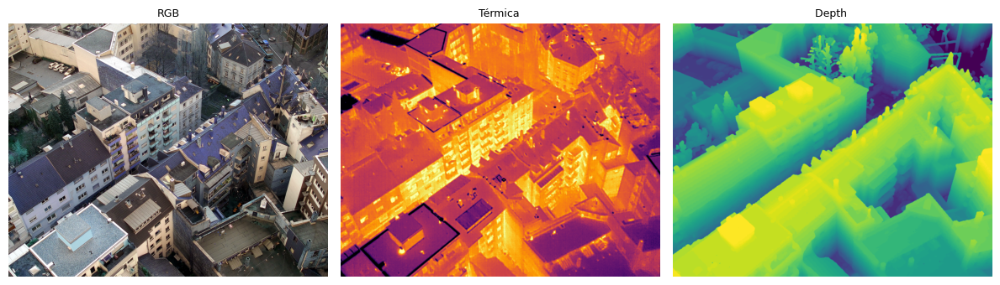

In [ ]:
SPLIT = "train"
split_txt = SPLITS_DIR / f"{SPLIT}.txt"
paths = load_split_paths(split_txt)
sample = random.sample(paths, min(N_SPLIT, len(paths)))

rows = len(sample)
fig, axes = plt.subplots(rows, 3, figsize=(12, max(2.8 * rows, 3.5)))
if rows == 1:
    axes = np.array([axes])

for i, p in enumerate(sample):
    arr = np.load(p)
    stem = p.stem

    if arr.ndim != 3 or arr.shape[-1] < 4:
        for j in range(3):
            axes[i, j].axis('off')
        axes[i, 0].set_title(f"{stem} (formato inesperado)")
        continue

    rgb = arr[..., :3]
    rgb_u8 = to_uint8_robust_rgb(rgb)
    axes[i, 0].imshow(rgb_u8)
    axes[i, 0].set_title("RGB", fontsize=9)
    axes[i, 0].axis('off')

    therm = arr[..., 3]
    therm_n = robust01(therm)
    axes[i, 1].imshow(therm_n, cmap=CMAP_THERM)
    axes[i, 1].set_title("Térmica", fontsize=9)
    axes[i, 1].axis('off')

    if arr.shape[-1] >= 5:
        depth = arr[..., 4]
        depth_n = robust01(depth)
        axes[i, 2].imshow(depth_n, cmap=CMAP_DEPTH)
        axes[i, 2].set_title("Depth", fontsize=9)
    else:
        axes[i, 2].imshow(np.zeros_like(therm_n), cmap='gray')
        axes[i, 2].set_title("Depth: no disponible", fontsize=9)
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


# Visualizar PNGs HST/GST 

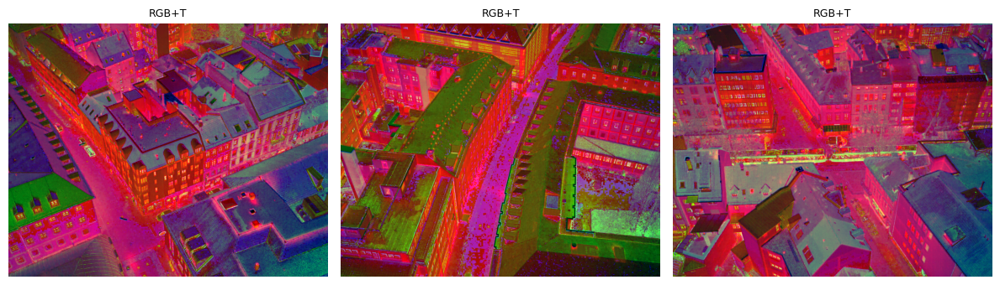

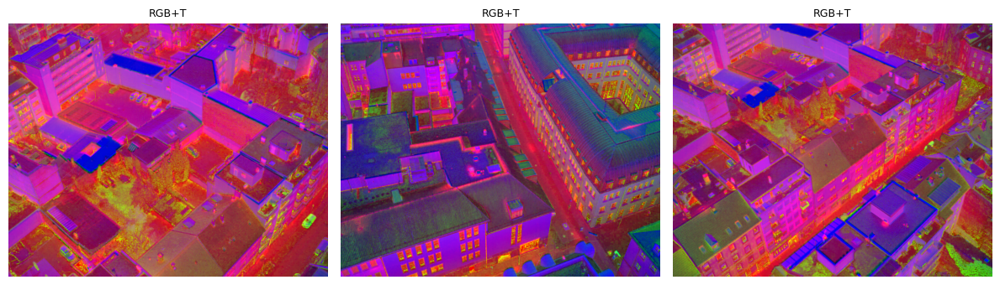

In [4]:

imgs = list(YOLO_IMAGES_DIR1.glob("*.png"))
if len(imgs) == 0:
    print(f"No hay PNGs en {YOLO_IMAGES_DIR1}")
else:
    sample_png = random.sample(imgs, min(N_YOLO, len(imgs)))
    rows, cols = grid_shape(len(sample_png), cols=3)
    plt.figure(figsize=(12, max(3.5, rows * 3.5)))
    for i, img_path in enumerate(sample_png):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title("RGB+T", fontsize=9)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

imgs2 = list(YOLO_IMAGES_DIR2.glob("*.png"))
if len(imgs2) == 0:
    print(f"No hay PNGs en {YOLO_IMAGES_DIR2}")
else:
    sample_png = random.sample(imgs2, min(N_YOLO, len(imgs2)))
    rows, cols = grid_shape(len(sample_png), cols=3)
    plt.figure(figsize=(12, max(3.5, rows * 3.5)))
    for i, img_path in enumerate(sample_png):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title("RGB+T", fontsize=9)
        plt.axis("off")
    plt.tight_layout()
    plt.show()


# Entrenamiento HST

In [ ]:
yaml_path = Path(BASE/"YOLO/HST/YOLO.yaml")
m = YOLO("yolo11x.pt")

results = m.train(
    data=yaml_path,
    epochs=120,
    imgsz=640,
    batch=16,
    device=0,
    workers=4,
    amp=True,
    project=BASE/"runs",
    name="yolo_hst",
    rect=False,
    cache="ram",
    patience=30,
    hsv_h=0.0, hsv_s=0.2, hsv_v=0.2,
    mosaic=0.8, mixup=0.0,
    flipud=0.0, fliplr=0.5,
    degrees=0.0, shear=0.0, translate=0.1, scale=0.5, perspective=0.0,
    optimizer="auto",
    cos_lr=True,
)

print(results)


100%|██████████| 109M/109M [00:01<00:00, 112MB/s]  


New https://pypi.org/project/ultralytics/8.3.235 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.2 🚀 Python-3.10.17 torch-2.9.1+cu128 CUDA:0 (NVIDIA L4, 22478MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/home/ignacio/ProyectoFinalVA/YOLO/HST/YOLO.yaml, epochs=120, time=None, patience=30, batch=16, imgsz=640, save=True, save_period=-1, cache=ram, device=0, workers=4, project=/home/ignacio/ProyectoFinalVA/runs, name=yolo_hst2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retin

100%|██████████| 5.35M/5.35M [00:00<00:00, 107MB/s]


AMP: checks passed ✅


train: Scanning /home/ignacio/ProyectoFinalVA/YOLO/HST/labels/train.cache... 325 images, 74 backgrounds, 0 corrupt: 100%|██████████| 399/399 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/ignacio/ProyectoFinalVA/YOLO/HST/images/train/DJI_0997_R.png: 10 duplicate labels removed


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.4GB RAM): 100%|██████████| 399/399 [00:40<00:00,  9.92it/s]
val: Scanning /home/ignacio/ProyectoFinalVA/YOLO/HST/labels/val.cache... 111 images, 23 backgrounds, 0 corrupt: 100%|██████████| 134/134 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/ignacio/ProyectoFinalVA/YOLO/HST/images/val/DJI_0995_R.png: 10 duplicate labels removed


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 134/134 [00:13<00:00, 10.28it/s]


Plotting labels to /home/ignacio/ProyectoFinalVA/runs/yolo_hst2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/ignacio/ProyectoFinalVA/runs/yolo_hst2
Starting training for 120 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/120      16.5G      3.652      4.748      2.561        119        640: 100%|██████████| 25/25 [00:36<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.36s/it]

                   all        134        810          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/120      16.9G      3.257      3.967      2.296        110        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

                   all        134        810          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/120      17.2G       3.22      3.245      2.269        187        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.91it/s]

                   all        134        810          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/120        17G      3.051          3      2.171        153        640: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

                   all        134        810          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/120        17G      2.983      2.778      2.099        138        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.88it/s]

                   all        134        810          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/120      17.2G      2.866      2.814      2.019        141        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.36it/s]

                   all        134        810      0.015     0.0444    0.00387    0.00117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/120      17.2G      2.737      2.601      1.988         91        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]

                   all        134        810     0.0645     0.0407    0.00864    0.00257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/120      17.2G      2.606      2.411      1.848        123        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.31it/s]

                   all        134        810     0.0484     0.0938     0.0263    0.00783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/120        17G      2.575       2.39      1.866        129        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.36it/s]

                   all        134        810     0.0934      0.058     0.0248    0.00705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/120      17.2G      2.487      2.289      1.783        124        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        134        810      0.131      0.112     0.0417     0.0123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/120      17.2G      2.459      2.239      1.768        103        640: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.28it/s]

                   all        134        810      0.203      0.106     0.0718     0.0206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/120      17.2G       2.44      2.239      1.757        137        640: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.40it/s]

                   all        134        810      0.175      0.111     0.0716     0.0268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/120        17G      2.386      2.109      1.717        134        640: 100%|██████████| 25/25 [00:18<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.35it/s]

                   all        134        810      0.253      0.102      0.078     0.0309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/120      17.2G      2.353      2.122      1.721        110        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.25it/s]

                   all        134        810      0.199      0.132     0.0792     0.0267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/120      17.2G      2.285      2.041       1.68        135        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.50it/s]

                   all        134        810      0.253      0.137      0.103     0.0365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/120      17.2G      2.274      2.026      1.649        156        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        134        810      0.244      0.147      0.105     0.0399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/120        17G      2.199      1.925      1.579        124        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.46it/s]

                   all        134        810      0.275      0.126      0.102     0.0387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/120      17.1G      2.129      1.852      1.557        118        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.45it/s]

                   all        134        810      0.295      0.183      0.138     0.0539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/120      17.2G      2.031      1.713      1.515        156        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.50it/s]

                   all        134        810      0.305      0.167      0.138     0.0552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/120      17.2G      2.122      1.804      1.556        104        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        134        810      0.354      0.198       0.16     0.0644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/120        17G      2.163      1.903      1.625        163        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        134        810      0.305      0.209      0.155     0.0611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/120      17.2G      2.052      1.794      1.537        126        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        134        810      0.266       0.12     0.0858     0.0265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/120      17.2G      2.024        1.7      1.489        103        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.39it/s]

                   all        134        810      0.365      0.175      0.163      0.066



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/120      17.1G      1.972      1.625      1.438        131        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        134        810      0.377      0.184       0.17     0.0668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/120      16.9G       2.02      1.677      1.472        155        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        134        810       0.42      0.194      0.179     0.0774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/120      17.2G      1.932      1.598      1.441         84        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.51it/s]

                   all        134        810      0.446       0.23      0.195     0.0874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/120      17.2G      1.921      1.577      1.453        112        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.44it/s]

                   all        134        810      0.345      0.198      0.166     0.0616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/120      17.2G       1.98      1.637      1.479         94        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        134        810       0.37      0.211      0.184     0.0805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/120        17G      1.896       1.55      1.436        139        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.51it/s]

                   all        134        810      0.508      0.199      0.205     0.0957



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/120      17.2G      1.875      1.577      1.429        138        640: 100%|██████████| 25/25 [00:18<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.38it/s]

                   all        134        810      0.397      0.193      0.191      0.088



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/120      17.2G      1.874      1.538      1.413        138        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        134        810      0.513      0.217      0.204     0.0887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/120      17.1G      1.772      1.388      1.345        143        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        134        810      0.498      0.254      0.243      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/120        17G       1.79      1.451      1.395        119        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        134        810      0.537       0.23      0.233      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/120      17.2G      1.747      1.383       1.35        103        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.50it/s]

                   all        134        810      0.519      0.242      0.222     0.0948



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/120      17.2G      1.794      1.423      1.371        133        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810      0.431      0.215        0.2     0.0905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/120      17.2G      1.807       1.42      1.365        113        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        134        810      0.558      0.237       0.25      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/120      16.9G      1.721      1.395      1.332        116        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        134        810      0.444      0.178      0.157     0.0516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/120      17.2G      1.712      1.345      1.315        127        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.50it/s]

                   all        134        810      0.493      0.238      0.225     0.0952



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/120      17.2G      1.732      1.362      1.353        131        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.45it/s]

                   all        134        810      0.522      0.255       0.24      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/120      17.2G      1.679      1.295      1.325        163        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.598      0.248      0.253      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/120        17G      1.725      1.313      1.311        119        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.50it/s]

                   all        134        810      0.517      0.246      0.242       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/120      17.2G      1.706      1.336      1.342        109        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.577      0.244      0.261      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/120      17.2G      1.654      1.247      1.309        136        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.619      0.265      0.281      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/120      17.2G      1.622      1.253       1.28        107        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        134        810      0.595       0.27      0.286      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/120      16.9G      1.662      1.266      1.288        133        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.45it/s]

                   all        134        810      0.508      0.249      0.243      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/120      17.1G      1.577      1.201      1.251        142        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810      0.582      0.262      0.268      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/120      17.2G      1.567      1.201      1.252         90        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810      0.519      0.277      0.269      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/120      17.2G      1.553      1.188      1.247        151        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.594      0.272      0.282      0.132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/120        17G      1.568      1.207      1.259        148        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.50it/s]

                   all        134        810      0.532      0.301      0.294      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/120      17.2G      1.574      1.188      1.271        112        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        134        810      0.538      0.281      0.282      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/120      17.2G      1.564       1.19      1.256        102        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        134        810      0.666      0.302      0.317      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/120      17.2G       1.55      1.165      1.255        108        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810       0.68      0.302      0.326      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/120        17G      1.509      1.123       1.24        104        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        134        810       0.64      0.311      0.333      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/120      17.2G      1.521      1.174      1.253         92        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810      0.598      0.248      0.267      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/120      17.1G      1.481      1.104      1.222        111        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810      0.616      0.309      0.334       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/120      17.2G      1.518      1.139      1.231        108        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.645      0.306      0.322      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/120        17G       1.49      1.095      1.232        152        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.50it/s]

                   all        134        810      0.655      0.288      0.311      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/120      17.2G      1.445      1.076       1.19         87        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.633      0.278      0.303      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/120      17.2G      1.412      1.059       1.19        103        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.684      0.295      0.328      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/120      17.2G      1.421      1.055      1.192        179        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        134        810      0.645      0.296      0.322      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/120        17G      1.414      1.055      1.191        119        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.692      0.311       0.34       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/120      17.2G      1.389      1.034      1.189        128        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.683      0.326      0.347      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/120      17.2G      1.417      1.034      1.177        125        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810      0.716       0.28      0.323      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/120      17.2G      1.389      1.033      1.159        122        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810      0.659      0.296      0.326      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/120      16.9G      1.348     0.9827      1.155         93        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.683       0.34      0.374        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/120      17.2G      1.321     0.9577      1.132        101        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.658      0.341      0.374      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/120      17.2G      1.337     0.9654      1.136        117        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.624      0.343      0.369      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/120      17.2G      1.331     0.9979      1.159        101        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.697      0.305      0.338      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/120        17G      1.343     0.9599      1.129        156        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810      0.642      0.309      0.333      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/120      17.2G      1.315     0.9468      1.155        104        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.656      0.346      0.364      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/120      17.2G      1.268     0.9267      1.111        167        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.739      0.326      0.364      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/120      17.1G      1.263     0.9096      1.112        137        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.668      0.323      0.355      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/120        17G      1.291     0.9229      1.104        124        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.52it/s]

                   all        134        810      0.745      0.325      0.365       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/120      17.2G      1.302     0.9481      1.123        131        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.719      0.309      0.338      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/120      17.2G      1.177     0.8486       1.07        154        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.716      0.329      0.362      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/120      17.2G      1.283     0.9335      1.128        121        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.699      0.323      0.353      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/120      16.9G      1.214     0.8766       1.08        146        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.739      0.304      0.362      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/120      17.2G      1.241     0.8766       1.09        110        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.718      0.331      0.374      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/120      17.2G      1.186     0.8334      1.065        126        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.691      0.347      0.373       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/120      17.2G      1.153     0.8285       1.08         86        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.669      0.352      0.368      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/120        17G      1.182     0.8432      1.087        133        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.687       0.32      0.353      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/120      17.2G      1.166     0.8243      1.072        154        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.681      0.351      0.374      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/120      17.2G      1.186     0.8463      1.074        143        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.676      0.364      0.387        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/120      17.2G      1.158     0.8281       1.06        121        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.715      0.353      0.381      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/120      16.9G      1.189     0.8542      1.091        123        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.727      0.341      0.375       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/120      17.2G      1.191     0.8506      1.075        145        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.686      0.344      0.377       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/120      17.2G      1.149     0.8317      1.068         88        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.667      0.373      0.389      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/120      17.2G      1.129     0.8114      1.058        123        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.647       0.36      0.382      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/120        17G      1.112     0.8077      1.061        112        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810       0.69      0.338      0.362      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/120      17.2G      1.116     0.8034      1.062        151        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.57it/s]

                   all        134        810      0.697      0.352      0.388      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/120      17.2G      1.103     0.7796      1.038        107        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.57it/s]

                   all        134        810      0.717      0.341      0.386      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/120      17.2G      1.085     0.7716      1.037         98        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.658      0.369      0.391      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/120        17G       1.09     0.7738      1.034        141        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.694      0.372      0.393      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/120      17.2G      1.052     0.7426      1.019        136        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.57it/s]

                   all        134        810      0.663      0.378      0.396      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/120      17.2G      1.055     0.7551      1.028        106        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.684      0.369      0.385      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/120      17.2G      1.045     0.7531      1.022        107        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.704      0.374      0.393      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/120        17G      1.088     0.7857      1.031        136        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.721      0.373      0.409      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/120      17.2G      1.082     0.7666      1.033        107        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.697      0.357      0.395      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/120      17.2G      1.041     0.7471      1.022        121        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.57it/s]

                   all        134        810      0.686      0.353      0.388      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/120      17.2G      1.004     0.7192       1.02        180        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.676      0.373      0.402      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/120        17G       1.03      0.737      1.018        146        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.618      0.395      0.401      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/120      17.2G     0.9927     0.7173      1.001        155        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.57it/s]

                   all        134        810      0.668       0.37      0.395      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/120      17.2G     0.9852     0.7004      1.008        125        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.57it/s]

                   all        134        810       0.68        0.4      0.413      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/120      17.2G      1.053     0.7632      1.043        137        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.747      0.374       0.41      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/120        17G       1.01     0.7094     0.9923        181        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.728      0.368      0.404      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/120      17.2G      1.019     0.7233      1.014        129        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.57it/s]

                   all        134        810      0.699      0.381      0.408      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/120      17.1G     0.9867     0.7092      1.007        138        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.721      0.377      0.408      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/120      17.2G      1.008     0.7174      1.017        130        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]

                   all        134        810      0.744       0.37      0.408      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/120        17G      0.981     0.6991      1.004        137        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.737       0.37       0.41      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/120      17.2G     0.9979     0.7306      1.006        119        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.57it/s]

                   all        134        810      0.696      0.398      0.416      0.215


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/120      17.2G       1.34      1.023      1.235         63        640: 100%|██████████| 25/25 [00:18<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.709      0.372      0.397      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/120      17.2G      1.329     0.9996       1.22         82        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.684      0.374      0.392      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/120        17G      1.293       0.96       1.21         90        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.695      0.364      0.388      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/120      17.2G      1.251     0.9658      1.192         78        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.696      0.359      0.384      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/120      17.2G      1.238     0.9449      1.183         71        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.681      0.369      0.391      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/120      17.2G      1.226     0.9303      1.171         75        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.659      0.372      0.393        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/120        17G      1.243     0.9382      1.183         75        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.53it/s]

                   all        134        810      0.714      0.363      0.393        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/120      17.2G      1.232     0.9394      1.189         76        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.54it/s]

                   all        134        810      0.702      0.362      0.389      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/120      17.2G      1.237     0.9279      1.173         86        640: 100%|██████████| 25/25 [00:18<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.689      0.365      0.387      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/120      17.2G      1.239     0.9281      1.169         76        640: 100%|██████████| 25/25 [00:18<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.55it/s]

                   all        134        810      0.684      0.375      0.394        0.2



120 epochs completed in 0.795 hours.
Optimizer stripped from /home/ignacio/ProyectoFinalVA/runs/yolo_hst2/weights/last.pt, 114.4MB
Optimizer stripped from /home/ignacio/ProyectoFinalVA/runs/yolo_hst2/weights/best.pt, 114.4MB

Validating /home/ignacio/ProyectoFinalVA/runs/yolo_hst2/weights/best.pt...
Ultralytics 8.3.2 🚀 Python-3.10.17 torch-2.9.1+cu128 CUDA:0 (NVIDIA L4, 22478MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.85it/s]


                   all        134        810      0.678        0.4      0.413      0.218
Speed: 0.2ms preprocess, 10.8ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /home/ignacio/ProyectoFinalVA/runs/yolo_hst2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ff1774fc190>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.03

# Resultados HST

Ultralytics 8.3.2 🚀 Python-3.10.17 torch-2.9.1+cu128 CUDA:0 (NVIDIA L4, 22478MiB)
YOLO11l summary (fused): 464 layers, 25,280,083 parameters, 0 gradients, 86.6 GFLOPs


val: Scanning /home/ignacio/ProyectoFinalVA/YOLO/HST/labels/val.cache... 111 images, 23 backgrounds, 0 corrupt: 100%|██████████| 134/134 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/ignacio/ProyectoFinalVA/YOLO/HST/images/val/DJI_0995_R.png: 10 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:15<00:00,  1.74s/it]


                   all        134        810       0.73      0.375      0.426      0.242
Speed: 2.0ms preprocess, 10.4ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/val53
===== MÉTRICAS GLOBALES (VAL) =====
Precision   (mp)      : 0.730
Recall      (mr)      : 0.375
mAP@0.5     (map50)   : 0.426
mAP@0.5:0.95 (map95)  : 0.242
Results saved to /home/ignacio/ProyectoFinalVA/runs/yolo_hst/pred_test
58 labels saved to /home/ignacio/ProyectoFinalVA/runs/yolo_hst/pred_test/labels


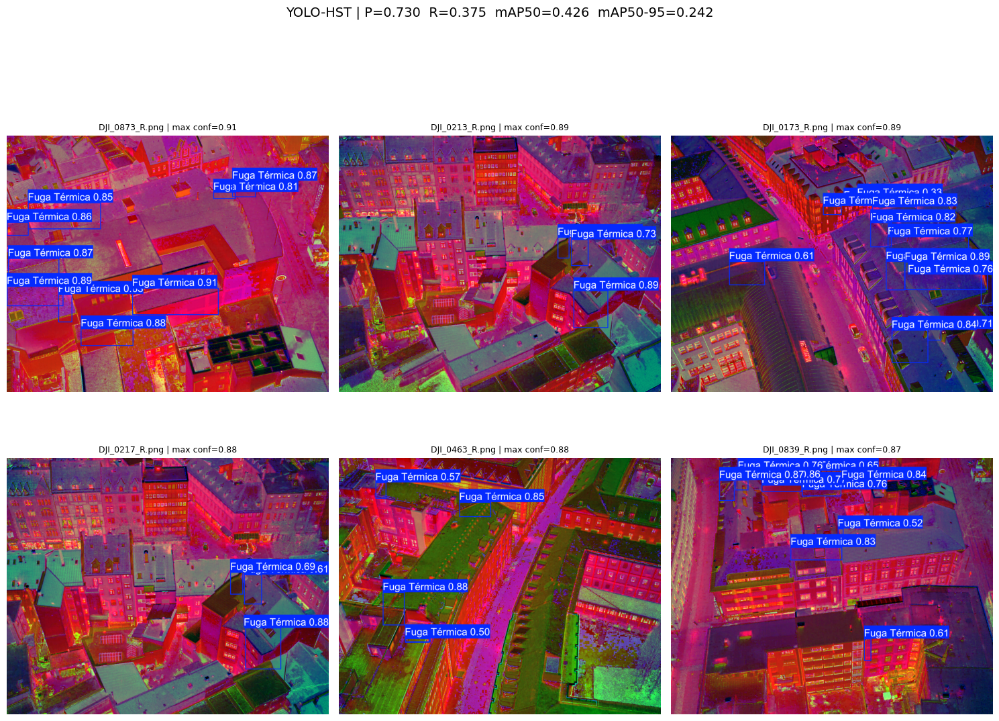

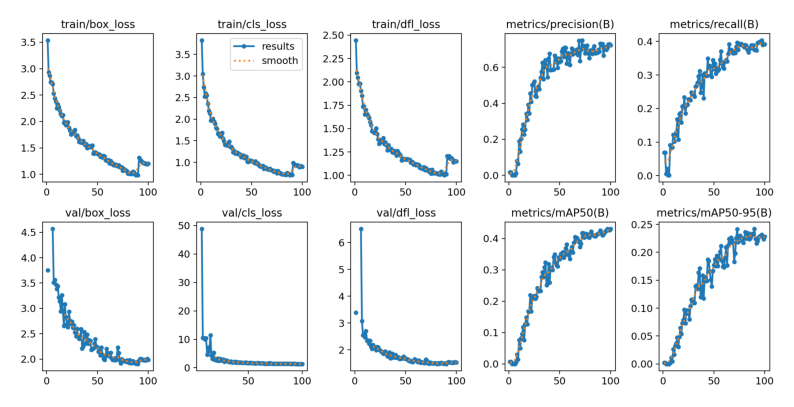

TXT de predicciones guardados en: /home/ignacio/ProyectoFinalVA/runs/yolo_hst/pred_test/labels


In [ ]:
RUN_NAME = "yolo_hst"
RUNS_DIR = Path(BASE/"runs")
BEST_WEIGHTS = RUNS_DIR / RUN_NAME / "weights" / "best.pt"
IMG_PATH = Path(BASE/"runs/yolo_hst/results.png")

DATA_YAML = Path(BASE/"YOLO/HST/YOLO.yaml")
DATA_ROOT = Path(BASE/"YOLO/HST")
TEST_DIR = DATA_ROOT / "images" / "test"

N_IMGS = 6
IMGSZ = 640
CONF = 0.25

PRED_RUN_NAME = "pred_test"

model = YOLO(str(BEST_WEIGHTS))

metrics = model.val(data=str(DATA_YAML))

mp = metrics.box.mp
mr = metrics.box.mr
map50 = metrics.box.map50
map95 = metrics.box.map

print("===== MÉTRICAS GLOBALES (VAL) =====")
print(f"Precision   (mp)      : {mp:.3f}")
print(f"Recall      (mr)      : {mr:.3f}")
print(f"mAP@0.5     (map50)   : {map50:.3f}")
print(f"mAP@0.5:0.95 (map95)  : {map95:.3f}")
print("====================================")

img_paths = (
    list(TEST_DIR.glob("*.png")) +
    list(TEST_DIR.glob("*.jpg")) +
    list(TEST_DIR.glob("*.jpeg"))
)
img_paths = sorted(img_paths)

if not img_paths:
    raise RuntimeError(f"No encontré imágenes en {TEST_DIR}")

results = model.predict(
    source=[str(p) for p in img_paths],
    imgsz=IMGSZ,
    conf=CONF,
    save_txt=True,
    save_conf=True,
    project=str(RUNS_DIR / RUN_NAME),
    name=PRED_RUN_NAME,
    exist_ok=True,
    verbose=False
)

scored = []
for path, res in zip(img_paths, results):
    if res.boxes is None or len(res.boxes) == 0:
        max_conf = 0.0
    else:
        max_conf = float(res.boxes.conf.max().cpu())
    scored.append((max_conf, path, res))

scored.sort(key=lambda x: x[0], reverse=True)

top = scored[:min(N_IMGS, len(scored))]

cols = 3
rows = (len(top) + cols - 1) // cols
plt.figure(figsize=(5 * cols, 5 * rows + 2))

plt.suptitle(
    f"YOLO-HST | P={mp:.3f}  R={mr:.3f}  mAP50={map50:.3f}  mAP50-95={map95:.3f}",
    fontsize=14, y=0.98
)

for i, (score, path, res) in enumerate(top, start=1):
    plotted = res.plot()
    plotted = plotted[..., ::-1]
    ax = plt.subplot(rows, cols, i)
    ax.imshow(plotted)
    ax.set_title(f"{path.name} | max conf={score:.2f}", fontsize=9)
    ax.axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(plt.imread(IMG_PATH))
plt.axis("off")
plt.show()

print(f"TXT de predicciones guardados en: {RUNS_DIR / RUN_NAME / PRED_RUN_NAME / 'labels'}")


# Entrenamiento GST

In [ ]:
yaml_path = Path(BASE/"YOLO/GST/YOLO_gst.yaml")
m = YOLO("yolo11l.pt")

results = m.train(
    data=yaml_path,
    epochs=100,
    imgsz=640,
    batch=8,
    device=0,
    workers=4,
    amp=True,
    project=BASE/"runs",
    name="yolo_gst",
    rect=False,
    cache="disk",
    patience=30,
    hsv_h=0.0, hsv_s=0.2, hsv_v=0.2,
    mosaic=0.8, mixup=0.0,
    flipud=0.0, fliplr=0.5,
    degrees=0.0, shear=0.0, translate=0.1, scale=0.5, perspective=0.0,
    optimizer="auto",
    cos_lr=True,
)

print(results)


New https://pypi.org/project/ultralytics/8.3.235 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.2 🚀 Python-3.10.17 torch-2.9.1+cu128 CUDA:0 (NVIDIA L4, 22478MiB)
engine/trainer: task=detect, mode=train, model=yolo11l.pt, data=/home/ignacio/ProyectoFinalVA/YOLO/GST/YOLO_gst.yaml, epochs=100, time=None, patience=30, batch=8, imgsz=640, save=True, save_period=-1, cache=disk, device=0, workers=4, project=/home/ignacio/ProyectoFinalVA/runs, name=yolo_gst3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, r

AMP: checks passed ✅


train: Scanning /home/ignacio/ProyectoFinalVA/YOLO/GST/labels/train.cache... 325 images, 74 backgrounds, 0 corrupt: 100%|██████████| 399/399 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/ignacio/ProyectoFinalVA/YOLO/GST/images/train/DJI_0997_R.png: 10 duplicate labels removed



train: Caching images (10.1GB Disk): 100%|██████████| 399/399 [00:00<00:00, 18981.98it/s]
val: Scanning /home/ignacio/ProyectoFinalVA/YOLO/GST/labels/val.cache... 111 images, 23 backgrounds, 0 corrupt: 100%|██████████| 134/134 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/ignacio/ProyectoFinalVA/YOLO/GST/images/val/DJI_0995_R.png: 10 duplicate labels removed



val: Caching images (3.4GB Disk): 100%|██████████| 134/134 [00:00<00:00, 18747.06it/s]


Plotting labels to /home/ignacio/ProyectoFinalVA/runs/yolo_gst3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /home/ignacio/ProyectoFinalVA/runs/yolo_gst3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      5.87G      3.538      3.793      2.537         50        640: 100%|██████████| 50/50 [01:15<00:00,  1.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.33it/s]

                   all        134        810   0.000994     0.0123   0.000366   9.93e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.12G      3.396      3.416      2.435         40        640: 100%|██████████| 50/50 [00:51<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.69it/s]

                   all        134        810   0.000327    0.00494   0.000143   4.98e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.07G       3.35      3.342      2.443         41        640: 100%|██████████| 50/50 [00:52<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.42it/s]

                   all        134        810   0.000736     0.0037   0.000359   0.000144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.08G      3.254      3.206      2.352         46        640: 100%|██████████| 50/50 [00:50<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.74it/s]

                   all        134        810   0.000736     0.0037   0.000359   0.000144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.14G      3.174      3.167       2.31         68        640: 100%|██████████| 50/50 [00:51<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.34it/s]

                   all        134        810     0.0292     0.0531    0.00882     0.0028



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.14G      3.112      3.035      2.265         41        640: 100%|██████████| 50/50 [00:52<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.89it/s]

                   all        134        810     0.0477     0.0642     0.0136    0.00404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.13G      3.091      3.092      2.217         36        640: 100%|██████████| 50/50 [00:51<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.75it/s]

                   all        134        810     0.0488     0.0494    0.00848     0.0024



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       6.1G      3.018      2.872      2.161         55        640: 100%|██████████| 50/50 [00:54<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.10it/s]

                   all        134        810     0.0851     0.0864     0.0255    0.00722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.13G      2.954      2.847      2.136         69        640: 100%|██████████| 50/50 [00:52<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.96it/s]

                   all        134        810     0.0824     0.0914     0.0304     0.0087



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.13G      2.915      2.801      2.113         31        640: 100%|██████████| 50/50 [00:52<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.41it/s]

                   all        134        810      0.113      0.101      0.039     0.0125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.13G      2.789      2.681      2.077         65        640: 100%|██████████| 50/50 [00:51<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.00it/s]

                   all        134        810      0.153       0.12     0.0489     0.0133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.14G      2.861      2.788      2.091         56        640: 100%|██████████| 50/50 [00:52<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.39it/s]

                   all        134        810      0.123      0.115     0.0434     0.0128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.13G      2.788      2.607      2.051         48        640: 100%|██████████| 50/50 [00:52<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.37it/s]

                   all        134        810      0.165      0.147     0.0695     0.0233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.15G      2.684       2.56      2.019        103        640: 100%|██████████| 50/50 [00:53<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.44it/s]

                   all        134        810       0.15      0.119     0.0529     0.0174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.13G      2.769      2.701      2.016         34        640: 100%|██████████| 50/50 [00:54<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.10it/s]

                   all        134        810      0.145      0.131     0.0576     0.0188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.13G      2.691      2.576      1.979         43        640: 100%|██████████| 50/50 [00:51<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.91it/s]

                   all        134        810      0.149      0.117     0.0629     0.0219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.14G      2.642      2.462      1.927         53        640: 100%|██████████| 50/50 [00:53<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.67it/s]

                   all        134        810      0.227      0.154      0.087     0.0279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.13G      2.591      2.375      1.893         61        640: 100%|██████████| 50/50 [00:52<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.13it/s]

                   all        134        810      0.195      0.164     0.0903     0.0324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.13G      2.573      2.405      1.883         70        640: 100%|██████████| 50/50 [00:52<00:00,  1.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.10it/s]

                   all        134        810      0.249      0.164     0.0893     0.0308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.13G      2.544      2.387      1.893         46        640: 100%|██████████| 50/50 [00:52<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.81it/s]

                   all        134        810      0.219      0.175     0.0942     0.0292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.13G      2.561       2.45      1.939         64        640: 100%|██████████| 50/50 [00:54<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.99it/s]

                   all        134        810      0.211      0.163      0.094     0.0328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.14G      2.534      2.333      1.863         87        640: 100%|██████████| 50/50 [00:51<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.19it/s]

                   all        134        810      0.269       0.16      0.122     0.0426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.14G      2.428      2.272      1.811         65        640: 100%|██████████| 50/50 [00:51<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.98it/s]

                   all        134        810      0.281      0.173      0.132     0.0443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.13G      2.407       2.15      1.753         62        640: 100%|██████████| 50/50 [00:51<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.38it/s]

                   all        134        810       0.28      0.177      0.132     0.0534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.13G      2.425      2.207      1.741         62        640: 100%|██████████| 50/50 [00:52<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.13it/s]

                   all        134        810      0.319      0.178      0.141     0.0548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.14G      2.378      2.181      1.759         78        640: 100%|██████████| 50/50 [00:52<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.16it/s]

                   all        134        810      0.285      0.201      0.132     0.0524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.15G      2.301      2.093       1.74         74        640: 100%|██████████| 50/50 [00:54<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.50it/s]

                   all        134        810      0.317      0.181      0.143      0.054



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.15G      2.351      2.217      1.788         25        640: 100%|██████████| 50/50 [00:51<00:00,  1.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.80it/s]

                   all        134        810      0.383      0.202      0.151     0.0527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.14G      2.323       2.17      1.744         51        640:  32%|███▏      | 16/50 [00:15<00:34,  1.02s/it]

# Resultados GST

Ultralytics 8.3.2 🚀 Python-3.10.17 torch-2.9.1+cu128 CUDA:0 (NVIDIA L4, 22478MiB)
YOLO11l summary (fused): 464 layers, 25,280,083 parameters, 0 gradients, 86.6 GFLOPs


val: Scanning /home/ignacio/ProyectoFinalVA/YOLO/GST/labels/val.cache... 111 images, 23 backgrounds, 0 corrupt: 100%|██████████| 134/134 [00:00<?, ?it/s]

val: WARNING ⚠️ /home/ignacio/ProyectoFinalVA/YOLO/GST/images/val/DJI_0995_R.png: 10 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.99it/s]


                   all        134        810      0.691      0.367      0.405      0.226
Speed: 0.8ms preprocess, 10.3ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/val58
===== MÉTRICAS GLOBALES (VAL) =====
Precision   (mp)      : 0.691
Recall      (mr)      : 0.367
mAP@0.5     (map50)   : 0.405
mAP@0.5:0.95 (map95)  : 0.226
Results saved to /home/ignacio/ProyectoFinalVA/runs/yolo_gst/pred_test
58 labels saved to /home/ignacio/ProyectoFinalVA/runs/yolo_gst/pred_test/labels


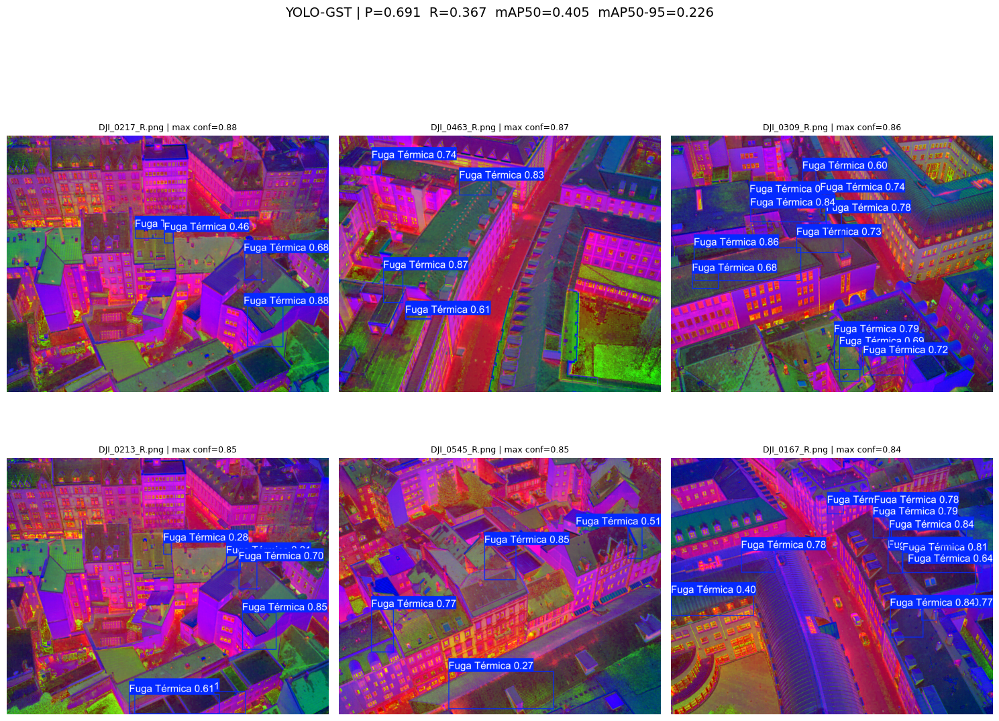

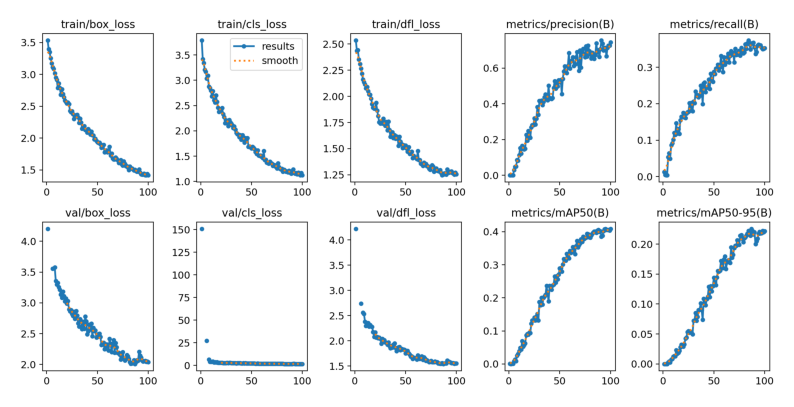

TXT de predicciones guardados en: /home/ignacio/ProyectoFinalVA/runs/yolo_gst/pred_test/labels


In [6]:
RUN_NAME = "yolo_gst"
RUNS_DIR = Path(BASE/"runs")
BEST_WEIGHTS = RUNS_DIR / RUN_NAME / "weights" / "best.pt"
IMG_PATH = Path(BASE/"runs/yolo_gst/results.png")

DATA_YAML = Path(BASE/"YOLO/GST/YOLO_gst.yaml")
DATA_ROOT = Path(BASE/"YOLO/GST")
TEST_DIR = DATA_ROOT / "images" / "test"

N_IMGS = 6
IMGSZ = 640
CONF = 0.25

PRED_RUN_NAME = "pred_test"

model = YOLO(str(BEST_WEIGHTS))

metrics = model.val(data=str(DATA_YAML))

mp = metrics.box.mp
mr = metrics.box.mr
map50 = metrics.box.map50
map95 = metrics.box.map

print("===== MÉTRICAS GLOBALES (VAL) =====")
print(f"Precision   (mp)      : {mp:.3f}")
print(f"Recall      (mr)      : {mr:.3f}")
print(f"mAP@0.5     (map50)   : {map50:.3f}")
print(f"mAP@0.5:0.95 (map95)  : {map95:.3f}")
print("====================================")

img_paths = (
    list(TEST_DIR.glob("*.png")) +
    list(TEST_DIR.glob("*.jpg")) +
    list(TEST_DIR.glob("*.jpeg"))
)
img_paths = sorted(img_paths)
pred_labels_dir = RUNS_DIR / RUN_NAME / PRED_RUN_NAME / "labels"

if pred_labels_dir.exists():
    for f in pred_labels_dir.glob("*.txt"):
        f.unlink()  # borra todos los txt viejos


results = model.predict(
    source=[str(p) for p in img_paths],
    imgsz=IMGSZ,
    conf=CONF,
    save_txt=True,
    save_conf=True,
    project=str(RUNS_DIR / RUN_NAME),
    name=PRED_RUN_NAME,
    exist_ok=True,
    verbose=False
)
scored = []
for path, res in zip(img_paths, results):
    if res.boxes is None or len(res.boxes) == 0:
        max_conf = 0.0
    else:
        max_conf = float(res.boxes.conf.max().cpu())
    scored.append((max_conf, path, res))

scored.sort(key=lambda x: x[0], reverse=True)

top = scored[:min(N_IMGS, len(scored))]

cols = 3
rows = (len(top) + cols - 1) // cols
plt.figure(figsize=(5 * cols, 5 * rows + 2))

plt.suptitle(
    f"YOLO-GST | P={mp:.3f}  R={mr:.3f}  mAP50={map50:.3f}  mAP50-95={map95:.3f}",
    fontsize=14, y=0.98
)

for i, (score, path, res) in enumerate(top, start=1):
    plotted = res.plot()
    plotted = plotted[..., ::-1]
    ax = plt.subplot(rows, cols, i)
    ax.imshow(plotted)
    ax.set_title(f"{path.name} | max conf={score:.2f}", fontsize=9)
    ax.axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(plt.imread(IMG_PATH))
plt.axis("off")
plt.show()

print(f"TXT de predicciones guardados en: {RUNS_DIR / RUN_NAME / PRED_RUN_NAME / 'labels'}")


In [7]:
GT_TEST_DIR = DATA_ROOT / "labels" / "test"
PRED_TXT_DIR = RUNS_DIR / RUN_NAME / PRED_RUN_NAME / "labels"

mAP_test, aps_test = compute_map(PRED_TXT_DIR, GT_TEST_DIR, iou_thresh=0.5)
print(f"mAP@0.5 (test) = {mAP_test:.3f}")


mAP@0.5 (test) = 0.341


In [8]:

RUN_NAME_GST = "yolo_gst"
PRED_RUN_NAME_GST = "pred_test"   
DATA_ROOT_GST = Path(BASE/"YOLO/GST")

GT_TEST_DIR_GST   = DATA_ROOT_GST / "labels" / "test"
PRED_TXT_DIR_GST  = RUNS_DIR / RUN_NAME_GST / PRED_RUN_NAME_GST / "labels"

print("\n======================= GST =======================")
mAP_gst, aps_gst = compute_map(PRED_TXT_DIR_GST, GT_TEST_DIR_GST, iou_thresh=0.5)
print(f"mAP@0.5 (GST) = {mAP_gst:.3f}")

RUN_NAME_HST = "yolo_hst"
PRED_RUN_NAME_HST = "pred_test"
DATA_ROOT_HST = Path(BASE/"YOLO/HST")

GT_TEST_DIR_HST   = DATA_ROOT_HST / "labels" / "test"
PRED_TXT_DIR_HST  = RUNS_DIR / RUN_NAME_HST / PRED_RUN_NAME_HST / "labels"

print("\n======================= HST =======================")
mAP_hst, aps_hst = compute_map(PRED_TXT_DIR_HST, GT_TEST_DIR_HST, iou_thresh=0.5)
print(f"mAP@0.5 (HST) = {mAP_hst:.3f}")



======================= GST =======================
mAP@0.5 (GST) = 0.341

======================= HST =======================
mAP@0.5 (HST) = 0.337


# Comparacion

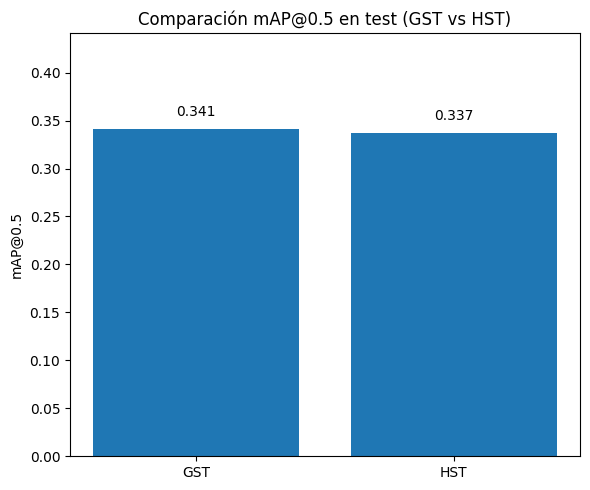

In [9]:
models = ["GST", "HST"]
maps = [mAP_gst, mAP_hst]

plt.figure(figsize=(6, 5))
x = np.arange(len(models))

plt.bar(x, maps)
plt.xticks(x, models)
plt.ylabel("mAP@0.5")
plt.title("Comparación mAP@0.5 en test (GST vs HST)")

for xi, val in zip(x, maps):
    plt.text(xi, val + 0.01, f"{val:.3f}", ha="center", va="bottom", fontsize=10)

plt.ylim(0, max(maps) + 0.1)
plt.tight_layout()
plt.show()